# MFB Use Case Requirements:

1. Predict the high incident areas
2. Future Average wait time of vehicles prediction
3. Predict the requirement of additional vehicles
4. New station creation forecast

### Beginning Logging in filename='notebook_execution_log.log'

In [1]:
import logging

# Configure logging
logging.basicConfig(filename='notebook_execution_log.log', 
                    level=logging.DEBUG,     
                    format='%(asctime)s - %(levelname)s - %(message)s',  
                    datefmt='%Y-%m-%d %H:%M:%S')  

# Define custom error handler
def log_error(exc_msg):
    logging.error(exc_msg)

# Log notebook execution start
logging.info("Notebook execution started.")

Importing the necessary packages and necessary libraries.

In [2]:
import warnings
warnings.simplefilter("ignore")
warnings.filterwarnings("ignore")
import pandas as pd
import numpy as np
import plotly.express as px
import pyodbc

import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import plotly.graph_objects as go

Ensuring that our dataframe observations do not have any truncated column information being displayed in this Jupter Notebook.

In [3]:
pd.set_option('display.max_columns', None)

- RESP_TIME_IN_MINS
- ACKNOWLEDGE_TIME_IN_MINS
- LEAVE_TIME_IN_MINS
- TRAVEL_TIME_IN_MINS

In the above 4 columns the seconds data are getting converted to minutes through a division by 60.

### Explanation:

If we have 699 seconds and we want to convert it into minutes:
699 seconds ÷ 60 = 11.65 minutes

Here, the decimal part .65 represents the remaining seconds after taking full minutes into account. So, 0.65 minutes is equivalent to 39 seconds (0.65 * 60 = 39).

So, the correct representation would be:
699 seconds = 11 minutes and 39 seconds

In this case, the decimal part of the minutes is 65, which is more than 59. However, it's important to understand that this decimal part represents the remaining seconds after converting the full minutes. It's a valid way to represent time durations, where the decimal part of the minutes can exceed 59 if there are remaining seconds beyond a full minute.

Therefore, when converting durations from seconds to minutes, if the decimal part of the minutes exceeds 59, it's justified as it represents the remaining seconds beyond a full minute.

In [4]:
# SWM Project connection string for SQL Server
connection_string = 'DRIVER={SQL Server};SERVER=192.168.0.100;DATABASE=MFB_LIVE;UID=sa;PWD=scs@123'
connection = pyodbc.connect(connection_string)

# SWM SQL query to select all records from the required table
query = "SELECT * FROM DP_MFB_BASE"

# Execute the query and store the result in a DataFrame
df = pd.read_sql(query, connection)
df # Top 5 and bottom 5 rows and columns details

,NUM_1,UNID,UNIT_STATUS,ACTION_CODE,LATITUDE,LONGITUDE,STATION,TYCOD,SUB_TYCOD,PRIM_UNIT,ALARM_LEV,CD_TS_CLEAN_DISP,CD_TS_CLEAN,DS_TS_CLEAN,EN_TS_CLEAN,AR_TS_CLEAN,RANGE,R_NO,VEHICLE_TYPE,RESP_TIME_IN_MINS,ACKNOWLEDGE_TIME_IN_MINS,LEAVE_TIME_IN_MINS,TRAVEL_TIME_IN_MINS,INCI_COMBINED,HOUR_INCI_BIN,MNTH,YR,MNTH_NAME,MNTH_YR,DAY_OF_WEEK,CLEAN_DATE
0,F202301228,MP47,Arrive,1,19.196222,72.822272,MALAD,RESCUE_SERVICE,ANIMAL_RESCUE,MP47,1,2023-01-20 13:24:34,2023-01-20 15:40:30,2023-01-20 13:24:54,2023-01-20 15:40:26,2023-01-20 15:40:30,REGION-4,4,MP,135.93,0.33,135.53,0.07,F202301228MP47,AFTERNOON,1,2023,January,Jan_2023,Friday,2023-01-20
1,F202301231,MP61,Dispatch,29,19.247632,72.862479,DAHISAR,RESCUE_SERVICE,BIRD_RESCUE,MP61,1,2023-01-20 13:55:53,2023-01-20 13:56:05,2023-01-20 13:56:05,2023-01-20 13:58:02,2023-01-20 14:03:59,REGION-4,1,MP,8.10,0.20,1.95,5.95,F202301231MP61,AFTERNOON,1,2023,January,Jan_2023,Friday,2023-01-20
2,F202301231,MP61,Acknowle,52,19.247632,72.862479,DAHISAR,RESCUE_SERVICE,BIRD_RESCUE,MP61,1,2023-01-20 13:55:53,2023-01-20 13:56:11,2023-01-20 13:56:05,2023-01-20 13:58:02,2023-01-20 14:03:59,REGION-4,2,MP,8.10,0.20,1.95,5.95,F202301231MP61,AFTERNOON,1,2023,January,Jan_2023,Friday,2023-01-20
3,F202301231,MP61,Enroute,32,19.247632,72.862479,DAHISAR,RESCUE_SERVICE,BIRD_RESCUE,MP61,1,2023-01-20 13:55:53,2023-01-20 13:58:02,2023-01-20 13:56:05,2023-01-20 13:58:02,2023-01-20 14:03:59,REGION-4,3,MP,8.10,0.20,1.95,5.95,F202301231MP61,AFTERNOON,1,2023,January,Jan_2023,Friday,2023-01-20
4,F202301231,MP61,Arrive,1,19.247632,72.862479,DAHISAR,RESCUE_SERVICE,BIRD_RESCUE,MP61,1,2023-01-20 13:55:53,2023-01-20 14:03:59,2023-01-20 13:56:05,2023-01-20 13:58:02,2023-01-20 14:03:59,REGION-4,4,MP,8.10,0.20,1.95,5.95,F202301231MP61,AFTERNOON,1,2023,January,Jan_2023,Friday,2023-01-20
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
90375,F202312981,MP59,Enroute,32,18.957974,72.832664,MEMONWADA,HOUSE_COLLAPSE,HOUSE_COLLAPSE,MP59,1,2023-09-19 12:44:34,2023-09-19 12:48:52,2023-09-19 12:45:08,2023-09-19 12:48:52,2023-09-19 13:01:37,REGION-1,3,MP,17.05,0.57,3.73,12.75,F202312981MP59,AFTERNOON,9,2023,September,Sep_2023,Tuesday,2023-09-19
90376,F202312981,MP59,Arrive,1,18.957974,72.832664,MEMONWADA,HOUSE_COLLAPSE,HOUSE_COLLAPSE,MP59,1,2023-09-19 12:44:34,2023-09-19 13:01:37,2023-09-19 12:45:08,2023-09-19 12:48:52,2023-09-19 13:01:37,REGION-1,4,MP,17.05,0.57,3.73,12.75,F202312981MP59,AFTERNOON,9,2023,September,Sep_2023,Tuesday,2023-09-19
90377,F202312995,MP37,Dispatch,29,19.054908,72.893549,CHEMBUR,OTHER_SERVICE,WALL_COLLAPSE,MP37,1,2023-09-19 22:52:08,2023-09-19 22:54:36,2023-09-19 22:54:36,2023-09-19 22:58:10,2023-09-19 23:13:12,REGION-5,1,MP,21.07,2.47,3.57,15.03,F202312995MP37,EVENING,9,2023,September,Sep_2023,Tuesday,2023-09-19
90378,F202312995,MP37,Acknowle,52,19.054908,72.893549,CHEMBUR,OTHER_SERVICE,WALL_COLLAPSE,MP37,1,2023-09-19 22:52:08,2023-09-19 22:54:50,2023-09-19 22:54:36,2023-09-19 22:58:10,2023-09-19 23:13:12,REGION-5,2,MP,21.07,2.47,3.57,15.03,F202312995MP37,EVENING,9,2023,September,Sep_2023,Tuesday,2023-09-19


Used SQL Server connection string to bring the needed table to Python and save it in a dataframe format.

### Column Description:

- NUM_1: Agency "event" number
- UNID: Shows the unit id details
- UNIT_STATUS: Gives the categorical status information about the unit on an incident
- ACTION_CODE: Numeric code details associated with the unit status category
- LATITUDE: Shows latitude co ordinates of the location
- LONGITUDE: Shows longitude co ordinates of the location
- STATION: Gives the station name information
- TYCOD: Provides the type code assigned to the incident/event
- SUB_TYCOD: Provides the sub type code assigned to the incident/event
- PRIM_UNIT: Primary Unit ID of unit that reported disposition code, requested case number via Assign Case Number, or arrived on the scene with the case number
- ALARM_LEV: This column shows the severity level code assigned to the incident
- CD_TS_CLEAN_DISP: Created Date Timestamp of AGENCY_EVENT table
- CD_TS_CLEAN: Created Date Timestamp of UN_HI (unit history) table
- DS_TS_CLEAN: Date Timestamp that the first unit was dispatched to the scene from UN_HI (unit history) table
- EN_TS_CLEAN: Date Timestamp when first unit was enroute to event from UN_HI (unit history) table
- AR_TS_CLEAN: Date Timestamp that the first unit arrived on the scene from UN_HI (unit history) table
- RANGE: Column shows the region wise information
- R_NO: Derived column created using ROW_NUMBER() OVER(PARTITION BY NUM_1 ORDER BY CD_TS_CLEAN ASC)
- VEHICLE_TYPE: Shows the vehicle type 2 letter codes
- RESP_TIME_IN_MINS: This column is derived by dividing TOT_RESP_TIME = (ACKNOWLEDGE_TIME +LEAVE_TIME + TRAVEL_TIME ) by 60 
- ACKNOWLEDGE_TIME_IN_MINS: This column is derived by dividing ACKNOWLEDGE_TIME [ABS(DATEDIFF(SECOND, CD_TS_CLEAN_DISP, DS_TS_CLEAN))] by 60
- LEAVE_TIME_IN_MINS: This column is derived by dividing LEAVE_TIME [ABS(DATEDIFF(SECOND, DS_TS_CLEAN, EN_TS_CLEAN))] by 60
- TRAVEL_TIME_IN_MINS: This column is derived by dividing TRAVEL_TIME [ABS(DATEDIFF(SECOND, EN_TS_CLEAN, AR_TS_CLEAN))] by 60
- INCI_COMBINED: NUM_1 + UNID columns are combined together to derive this column
- HOUR_INCI_BIN: Derived column that created bins using case in SQL where morning, afternoon, evening and night bins are created
- MNTH: Derived column showing the numeric value of month information
- YR: Derived column with year details
- MNTH_NAME: Derived column that shows only the entire month name information
- MNTH_YR: Derived column with Month name 3 letter code and Year details together
- DAY_OF_WEEK: Derived column that shows the day name of the week
- CLEAN_DATE: Derived column by casting date from "CD_TS_CLEAN" column which is again a derived column from "CDTS" a column present in "UN_HI" table

# Data Preprocessing

In [5]:
df.drop(['NUM_1', 'UNID', 'PRIM_UNIT', 'DS_TS_CLEAN', 'EN_TS_CLEAN', 'AR_TS_CLEAN', 'MNTH_YR', 'INCI_COMBINED']
        , axis=1, inplace=True)

In [6]:
df

,UNIT_STATUS,ACTION_CODE,LATITUDE,LONGITUDE,STATION,TYCOD,SUB_TYCOD,ALARM_LEV,CD_TS_CLEAN_DISP,CD_TS_CLEAN,RANGE,R_NO,VEHICLE_TYPE,RESP_TIME_IN_MINS,ACKNOWLEDGE_TIME_IN_MINS,LEAVE_TIME_IN_MINS,TRAVEL_TIME_IN_MINS,HOUR_INCI_BIN,MNTH,YR,MNTH_NAME,DAY_OF_WEEK,CLEAN_DATE
0,Arrive,1,19.196222,72.822272,MALAD,RESCUE_SERVICE,ANIMAL_RESCUE,1,2023-01-20 13:24:34,2023-01-20 15:40:30,REGION-4,4,MP,135.93,0.33,135.53,0.07,AFTERNOON,1,2023,January,Friday,2023-01-20
1,Dispatch,29,19.247632,72.862479,DAHISAR,RESCUE_SERVICE,BIRD_RESCUE,1,2023-01-20 13:55:53,2023-01-20 13:56:05,REGION-4,1,MP,8.10,0.20,1.95,5.95,AFTERNOON,1,2023,January,Friday,2023-01-20
2,Acknowle,52,19.247632,72.862479,DAHISAR,RESCUE_SERVICE,BIRD_RESCUE,1,2023-01-20 13:55:53,2023-01-20 13:56:11,REGION-4,2,MP,8.10,0.20,1.95,5.95,AFTERNOON,1,2023,January,Friday,2023-01-20
3,Enroute,32,19.247632,72.862479,DAHISAR,RESCUE_SERVICE,BIRD_RESCUE,1,2023-01-20 13:55:53,2023-01-20 13:58:02,REGION-4,3,MP,8.10,0.20,1.95,5.95,AFTERNOON,1,2023,January,Friday,2023-01-20
4,Arrive,1,19.247632,72.862479,DAHISAR,RESCUE_SERVICE,BIRD_RESCUE,1,2023-01-20 13:55:53,2023-01-20 14:03:59,REGION-4,4,MP,8.10,0.20,1.95,5.95,AFTERNOON,1,2023,January,Friday,2023-01-20
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
90375,Enroute,32,18.957974,72.832664,MEMONWADA,HOUSE_COLLAPSE,HOUSE_COLLAPSE,1,2023-09-19 12:44:34,2023-09-19 12:48:52,REGION-1,3,MP,17.05,0.57,3.73,12.75,AFTERNOON,9,2023,September,Tuesday,2023-09-19
90376,Arrive,1,18.957974,72.832664,MEMONWADA,HOUSE_COLLAPSE,HOUSE_COLLAPSE,1,2023-09-19 12:44:34,2023-09-19 13:01:37,REGION-1,4,MP,17.05,0.57,3.73,12.75,AFTERNOON,9,2023,September,Tuesday,2023-09-19
90377,Dispatch,29,19.054908,72.893549,CHEMBUR,OTHER_SERVICE,WALL_COLLAPSE,1,2023-09-19 22:52:08,2023-09-19 22:54:36,REGION-5,1,MP,21.07,2.47,3.57,15.03,EVENING,9,2023,September,Tuesday,2023-09-19
90378,Acknowle,52,19.054908,72.893549,CHEMBUR,OTHER_SERVICE,WALL_COLLAPSE,1,2023-09-19 22:52:08,2023-09-19 22:54:50,REGION-5,2,MP,21.07,2.47,3.57,15.03,EVENING,9,2023,September,Tuesday,2023-09-19


Dropped columns that have more than 50% missing records and the ones that only have unique values or id related information which do not contribute in the model learning.

In [7]:
!pip install reverse_geocoder
import reverse_geocoder as rg
import pprint

Converting our latitude and longitude data present in our dataset and getting the geographical location of it instead of seeing just coordinates and therefore have imported the required dependencies here.

In [8]:
geodata=[]
def reverse_geocoordinates(coordinates):
    result = rg.search(coordinates)
    return (result)

if __name__=="__main__":
    coordinates = list(zip(df['LATITUDE'], df['LONGITUDE']))
    data = reverse_geocoordinates(coordinates)
    geodata.append(data)

geo_names = pd.DataFrame(geodata).transpose()
print(geo_names)

Loading formatted geocoded file...
                                                       0
0      {'lat': '19.23496', 'lon': '72.85976', 'name':...
1      {'lat': '19.23496', 'lon': '72.85976', 'name':...
2      {'lat': '19.23496', 'lon': '72.85976', 'name':...
3      {'lat': '19.23496', 'lon': '72.85976', 'name':...
4      {'lat': '19.23496', 'lon': '72.85976', 'name':...
...                                                  ...
90375  {'lat': '19.07283', 'lon': '72.88261', 'name':...
90376  {'lat': '19.07283', 'lon': '72.88261', 'name':...
90377  {'lat': '19.07283', 'lon': '72.88261', 'name':...
90378  {'lat': '19.07283', 'lon': '72.88261', 'name':...
90379  {'lat': '19.07283', 'lon': '72.88261', 'name':...

[90380 rows x 1 columns]


So here I have acquired the state and city names corresponding to it's latitude and longitude data however we will need to incorporate it properly inside our dataset and format it.

In [9]:
df['City']=geo_names[0].apply(lambda x:x.get('name'))
df.drop(['LATITUDE','LONGITUDE'], axis=1, inplace=True)
df

,UNIT_STATUS,ACTION_CODE,STATION,TYCOD,SUB_TYCOD,ALARM_LEV,CD_TS_CLEAN_DISP,CD_TS_CLEAN,RANGE,R_NO,VEHICLE_TYPE,RESP_TIME_IN_MINS,ACKNOWLEDGE_TIME_IN_MINS,LEAVE_TIME_IN_MINS,TRAVEL_TIME_IN_MINS,HOUR_INCI_BIN,MNTH,YR,MNTH_NAME,DAY_OF_WEEK,CLEAN_DATE,City
0,Arrive,1,MALAD,RESCUE_SERVICE,ANIMAL_RESCUE,1,2023-01-20 13:24:34,2023-01-20 15:40:30,REGION-4,4,MP,135.93,0.33,135.53,0.07,AFTERNOON,1,2023,January,Friday,2023-01-20,Borivli
1,Dispatch,29,DAHISAR,RESCUE_SERVICE,BIRD_RESCUE,1,2023-01-20 13:55:53,2023-01-20 13:56:05,REGION-4,1,MP,8.10,0.20,1.95,5.95,AFTERNOON,1,2023,January,Friday,2023-01-20,Borivli
2,Acknowle,52,DAHISAR,RESCUE_SERVICE,BIRD_RESCUE,1,2023-01-20 13:55:53,2023-01-20 13:56:11,REGION-4,2,MP,8.10,0.20,1.95,5.95,AFTERNOON,1,2023,January,Friday,2023-01-20,Borivli
3,Enroute,32,DAHISAR,RESCUE_SERVICE,BIRD_RESCUE,1,2023-01-20 13:55:53,2023-01-20 13:58:02,REGION-4,3,MP,8.10,0.20,1.95,5.95,AFTERNOON,1,2023,January,Friday,2023-01-20,Borivli
4,Arrive,1,DAHISAR,RESCUE_SERVICE,BIRD_RESCUE,1,2023-01-20 13:55:53,2023-01-20 14:03:59,REGION-4,4,MP,8.10,0.20,1.95,5.95,AFTERNOON,1,2023,January,Friday,2023-01-20,Borivli
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
90375,Enroute,32,MEMONWADA,HOUSE_COLLAPSE,HOUSE_COLLAPSE,1,2023-09-19 12:44:34,2023-09-19 12:48:52,REGION-1,3,MP,17.05,0.57,3.73,12.75,AFTERNOON,9,2023,September,Tuesday,2023-09-19,Mumbai
90376,Arrive,1,MEMONWADA,HOUSE_COLLAPSE,HOUSE_COLLAPSE,1,2023-09-19 12:44:34,2023-09-19 13:01:37,REGION-1,4,MP,17.05,0.57,3.73,12.75,AFTERNOON,9,2023,September,Tuesday,2023-09-19,Mumbai
90377,Dispatch,29,CHEMBUR,OTHER_SERVICE,WALL_COLLAPSE,1,2023-09-19 22:52:08,2023-09-19 22:54:36,REGION-5,1,MP,21.07,2.47,3.57,15.03,EVENING,9,2023,September,Tuesday,2023-09-19,Mumbai
90378,Acknowle,52,CHEMBUR,OTHER_SERVICE,WALL_COLLAPSE,1,2023-09-19 22:52:08,2023-09-19 22:54:50,REGION-5,2,MP,21.07,2.47,3.57,15.03,EVENING,9,2023,September,Tuesday,2023-09-19,Mumbai


In [10]:
object_datatype = []
for x in df.dtypes.index:
    if df.dtypes[x] == 'O':
        object_datatype.append(x)
object_datatype

['UNIT_STATUS',
 'STATION',
 'TYCOD',
 'SUB_TYCOD',
 'RANGE',
 'VEHICLE_TYPE',
 'HOUR_INCI_BIN',
 'MNTH_NAME',
 'DAY_OF_WEEK',
 'CLEAN_DATE',
 'City']

In [11]:
numeric_datatype = []
for x in df.dtypes.index:
    if df.dtypes[x] == 'int64' or df.dtypes[x] == 'float64':
        numeric_datatype.append(x)
numeric_datatype

['ACTION_CODE',
 'ALARM_LEV',
 'R_NO',
 'RESP_TIME_IN_MINS',
 'ACKNOWLEDGE_TIME_IN_MINS',
 'LEAVE_TIME_IN_MINS',
 'TRAVEL_TIME_IN_MINS',
 'MNTH',
 'YR']

# Exploratory Data Analysis

In [12]:
df.columns

Index(['UNIT_STATUS', 'ACTION_CODE', 'STATION', 'TYCOD', 'SUB_TYCOD',
       'ALARM_LEV', 'CD_TS_CLEAN_DISP', 'CD_TS_CLEAN', 'RANGE', 'R_NO',
       'VEHICLE_TYPE', 'RESP_TIME_IN_MINS', 'ACKNOWLEDGE_TIME_IN_MINS',
       'LEAVE_TIME_IN_MINS', 'TRAVEL_TIME_IN_MINS', 'HOUR_INCI_BIN', 'MNTH',
       'YR', 'MNTH_NAME', 'DAY_OF_WEEK', 'CLEAN_DATE', 'City'],
      dtype='object')

Checking the total number of columns here and got there names that shall further be drilled to check essential features.

In [13]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 90380 entries, 0 to 90379
Data columns (total 22 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   UNIT_STATUS               90380 non-null  object        
 1   ACTION_CODE               90380 non-null  int64         
 2   STATION                   90380 non-null  object        
 3   TYCOD                     90380 non-null  object        
 4   SUB_TYCOD                 90380 non-null  object        
 5   ALARM_LEV                 90380 non-null  int64         
 6   CD_TS_CLEAN_DISP          90380 non-null  datetime64[ns]
 7   CD_TS_CLEAN               90380 non-null  datetime64[ns]
 8   RANGE                     90380 non-null  object        
 9   R_NO                      90380 non-null  int64         
 10  VEHICLE_TYPE              90380 non-null  object        
 11  RESP_TIME_IN_MINS         90380 non-null  float64       
 12  ACKNOWLEDGE_TIME_I

Checking for detailed information on the column records number and where it has missing values while the column types to understand numeric, object/string and datetime column details.

In [14]:
df.describe()

,ACTION_CODE,ALARM_LEV,CD_TS_CLEAN_DISP,CD_TS_CLEAN,R_NO,RESP_TIME_IN_MINS,ACKNOWLEDGE_TIME_IN_MINS,LEAVE_TIME_IN_MINS,TRAVEL_TIME_IN_MINS,MNTH,YR
count,90380.000000,90380.000000,90380,90380,90380.000000,90380.000000,90380.000000,90380.000000,90380.000000,90380.000000,90380.000000
mean,29.138460,1.016774,2023-05-21 17:16:58.174042624,2023-05-21 17:33:17.038271744,5.960998,25.200767,1.788263,5.695126,17.717410,6.120027,2022.919551
min,0.000000,0.000000,2022-11-30 07:54:50,2022-11-30 07:55:26,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2022.000000
25%,29.000000,1.000000,2023-02-15 08:34:02,2023-02-15 08:43:01.249999872,2.000000,13.300000,0.270000,2.080000,6.600000,3.000000,2023.000000
50%,29.000000,1.000000,2023-05-09 13:43:22,2023-05-09 14:28:22,3.000000,20.575000,0.480000,3.730000,14.180000,6.000000,2023.000000
75%,41.000000,1.000000,2023-08-13 03:26:57,2023-08-13 03:35:17.249999872,6.000000,30.970000,1.120000,5.970000,23.280000,9.000000,2023.000000
max,82.000000,4.000000,2023-12-21 00:58:03,2023-12-21 00:59:04,202.000000,477.370000,192.530000,297.770000,469.300000,12.000000,2023.000000
std,17.382251,0.207265,NaN,NaN,9.730814,22.433706,7.258522,10.738545,18.833388,3.683380,0.271989


In [15]:
df.describe().T # using the transpose option since we have larger number of columns

,count,mean,min,25%,50%,75%,max,std
ACTION_CODE,90380.0,29.13846,0.0,29.0,29.0,41.0,82.0,17.382251
ALARM_LEV,90380.0,1.016774,0.0,1.0,1.0,1.0,4.0,0.207265
CD_TS_CLEAN_DISP,90380,2023-05-21 17:16:58.174042624,2022-11-30 07:54:50,2023-02-15 08:34:02,2023-05-09 13:43:22,2023-08-13 03:26:57,2023-12-21 00:58:03,NaN
CD_TS_CLEAN,90380,2023-05-21 17:33:17.038271744,2022-11-30 07:55:26,2023-02-15 08:43:01.249999872,2023-05-09 14:28:22,2023-08-13 03:35:17.249999872,2023-12-21 00:59:04,NaN
R_NO,90380.0,5.960998,1.0,2.0,3.0,6.0,202.0,9.730814
RESP_TIME_IN_MINS,90380.0,25.200767,0.0,13.3,20.575,30.97,477.37,22.433706
ACKNOWLEDGE_TIME_IN_MINS,90380.0,1.788263,0.0,0.27,0.48,1.12,192.53,7.258522
LEAVE_TIME_IN_MINS,90380.0,5.695126,0.0,2.08,3.73,5.97,297.77,10.738545
TRAVEL_TIME_IN_MINS,90380.0,17.71741,0.0,6.6,14.18,23.28,469.3,18.833388
MNTH,90380.0,6.120027,1.0,3.0,6.0,9.0,12.0,3.68338


Using the describe function on the numeric columns tracking the records of minimum, maximun and skewness information to observe quantile differences and check for abnormalities in the number.

In [16]:
df.isna().sum()

UNIT_STATUS                 0
ACTION_CODE                 0
STATION                     0
TYCOD                       0
SUB_TYCOD                   0
ALARM_LEV                   0
CD_TS_CLEAN_DISP            0
CD_TS_CLEAN                 0
RANGE                       0
R_NO                        0
VEHICLE_TYPE                0
RESP_TIME_IN_MINS           0
ACKNOWLEDGE_TIME_IN_MINS    0
LEAVE_TIME_IN_MINS          0
TRAVEL_TIME_IN_MINS         0
HOUR_INCI_BIN               0
MNTH                        0
YR                          0
MNTH_NAME                   0
DAY_OF_WEEK                 0
CLEAN_DATE                  0
City                        0
dtype: int64

Taking a note of all the columns that have missing values and since they are just 3 columns with a majority chunk of missing records will be dropping them and the other unwanted columns which shall give us a smaller pool of feature selection options to generate the appropriate time equivalent variable.

In [17]:
print("Missing values in percentage:\n")
for col in df:
    percentage = np.round((df[col].isnull().sum() / df.shape[0]) * 100, 3)
    # Calculate the width of the longest column name plus some padding
    max_col_width = max(len(col) for col in df.columns) + 2
    # Align the colon ":" using string formatting
    print(f"{col : <{max_col_width}} {percentage}%")

Missing values in percentage:

UNIT_STATUS                0.0%
ACTION_CODE                0.0%
STATION                    0.0%
TYCOD                      0.0%
SUB_TYCOD                  0.0%
ALARM_LEV                  0.0%
CD_TS_CLEAN_DISP           0.0%
CD_TS_CLEAN                0.0%
RANGE                      0.0%
R_NO                       0.0%
VEHICLE_TYPE               0.0%
RESP_TIME_IN_MINS          0.0%
ACKNOWLEDGE_TIME_IN_MINS   0.0%
LEAVE_TIME_IN_MINS         0.0%
TRAVEL_TIME_IN_MINS        0.0%
HOUR_INCI_BIN              0.0%
MNTH                       0.0%
YR                         0.0%
MNTH_NAME                  0.0%
DAY_OF_WEEK                0.0%
CLEAN_DATE                 0.0%
City                       0.0%


In [18]:
print("We had {} Rows and {} Columns before dropping duplicates.".format(df.shape[0], df.shape[1]))
df.drop_duplicates(inplace=True)
print("We have {} Rows and {} Columns after dropping duplicates.".format(df.shape[0], df.shape[1]))

We had 90380 Rows and 22 Columns before dropping duplicates.
We have 90380 Rows and 22 Columns after dropping duplicates.


With the `drop_duplicates` option I was trying to get rid of all the duplicate values present in our dataset. However, we can see that there are no duplicate data present in our dataset right now.

In [19]:
df.nunique().sort_values().to_frame("Unique Values") # checking the list of unique value numbers/categories in the columns

,Unique Values
YR,2
HOUR_INCI_BIN,4
TYCOD,5
ALARM_LEV,5
RANGE,6
City,7
DAY_OF_WEEK,7
ACTION_CODE,12
MNTH_NAME,12
MNTH,12


In [20]:
for col in df.columns:
    print(df[col].value_counts())
    print("="*120)

UNIT_STATUS
Dispatch    25859
Enroute     21314
Acknowle    20018
Arrive      19932
Availabl     3010
DC            214
DW             14
ArriveDa        7
RF              5
Transpor        4
UC              1
~               1
TA              1
Name: count, dtype: int64
ACTION_CODE
29    25859
32    21314
52    20018
1     19932
41     2997
74      214
25       14
26       13
70       12
82        5
56        1
0         1
Name: count, dtype: int64
STATION
MAROL         6441
ANDHERI       5051
KANDIVALI     4887
CHEMBUR       4778
BANDRA        4375
MULUND        4089
DINDOSHI      3869
BYCULLA       3617
MEMONWADA     3492
BORIVALI      3414
GAWALATANK    3279
BKC           3211
MALAD         3123
VIKHROLI      3069
MANKHURD      2890
DADAR         2802
WORLI         2635
VILE PARLE    2551
DAHISAR       2482
GOREGAON      2476
WADALA        2153
GAWANPADA     2079
CHINCHOLI     1933
FORT          1621
MANDVI        1347
DHARAVI       1194
DEONAR        1171
KURLA         1129
RAOLI 

In [21]:
df[numeric_datatype].corr()

,ACTION_CODE,ALARM_LEV,R_NO,RESP_TIME_IN_MINS,ACKNOWLEDGE_TIME_IN_MINS,LEAVE_TIME_IN_MINS,TRAVEL_TIME_IN_MINS,MNTH,YR
ACTION_CODE,1.000000,-0.007183,-0.163161,-0.023516,0.001580,-0.004984,-0.025780,-0.004682,-0.003778
ALARM_LEV,-0.007183,1.000000,0.568621,-0.012501,-0.011745,-0.011368,-0.003883,-0.037783,0.026881
R_NO,-0.163161,0.568621,1.000000,-0.004806,-0.024220,-0.018400,0.014103,0.036902,-0.004998
RESP_TIME_IN_MINS,-0.023516,-0.012501,-0.004806,1.000000,0.296066,0.451405,0.819676,0.028222,-0.022956
ACKNOWLEDGE_TIME_IN_MINS,0.001580,-0.011745,-0.024220,0.296066,1.000000,-0.017096,-0.022992,-0.007728,0.021693
LEAVE_TIME_IN_MINS,-0.004984,-0.011368,-0.018400,0.451405,-0.017096,1.000000,-0.025899,0.021951,-0.030810
TRAVEL_TIME_IN_MINS,-0.025780,-0.003883,0.014103,0.819676,-0.022992,-0.025899,1.000000,0.024082,-0.018135
MNTH,-0.004682,-0.037783,0.036902,0.028222,-0.007728,0.021951,0.024082,1.000000,-0.470542
YR,-0.003778,0.026881,-0.004998,-0.022956,0.021693,-0.030810,-0.018135,-0.470542,1.000000


# Data Visualization

<Axes: >

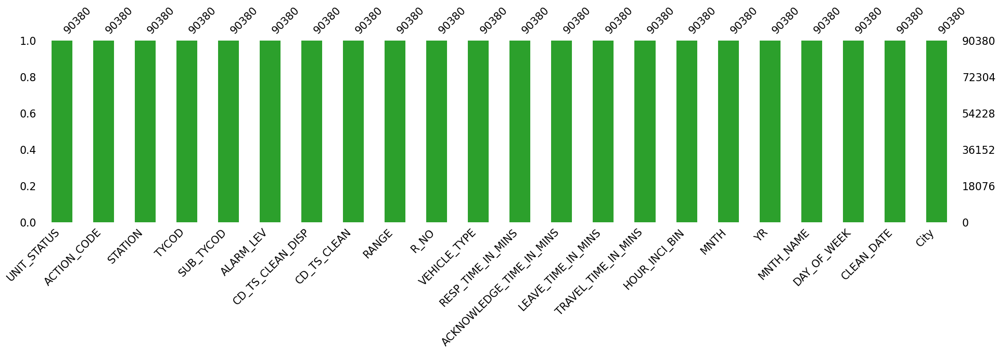

In [22]:
import missingno
missingno.bar(df, figsize = (25,5), color="tab:green")

A visual repressentation of records in each column to identify the columns that have missing values and discard the non needed information or impute the missing rows filled with appropriate data.

In [23]:
df[numeric_datatype].describe().T

,count,mean,std,min,25%,50%,75%,max
ACTION_CODE,90380.0,29.138460,17.382251,0.0,29.00,29.000,41.00,82.00
ALARM_LEV,90380.0,1.016774,0.207265,0.0,1.00,1.000,1.00,4.00
R_NO,90380.0,5.960998,9.730814,1.0,2.00,3.000,6.00,202.00
RESP_TIME_IN_MINS,90380.0,25.200767,22.433706,0.0,13.30,20.575,30.97,477.37
ACKNOWLEDGE_TIME_IN_MINS,90380.0,1.788263,7.258522,0.0,0.27,0.480,1.12,192.53
LEAVE_TIME_IN_MINS,90380.0,5.695126,10.738545,0.0,2.08,3.730,5.97,297.77
TRAVEL_TIME_IN_MINS,90380.0,17.717410,18.833388,0.0,6.60,14.180,23.28,469.30
MNTH,90380.0,6.120027,3.683380,1.0,3.00,6.000,9.00,12.00
YR,90380.0,2022.919551,0.271989,2022.0,2023.00,2023.000,2023.00,2023.00


In [24]:
import ydata_profiling as pp

pp.ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [25]:
# Generate summary statistics
summary_stats = df[numeric_datatype].describe().T

# Create heatmap
heatmap = go.Heatmap(
    z=summary_stats.values,
    x=summary_stats.columns,
    y=summary_stats.index,
    colorscale='cividis',
    colorbar=dict(title='Value'),
)

# Create annotations
annotations = []
for i, row in enumerate(summary_stats.values):
    for j, value in enumerate(row):
        annotations.append(
            dict(
                x=summary_stats.columns[j],
                y=summary_stats.index[i],
                text=str(round(value, 2)),
                showarrow=False,
                font=dict(color='white')
            )
        )

# Create figure
fig = go.Figure(data=heatmap)

# Add annotations to the figure layout
fig.update_layout(annotations=annotations)

# Add title
fig.update_layout(title='Statistical Heatmap for Numeric Value Columns')

# Show plot
fig.show()

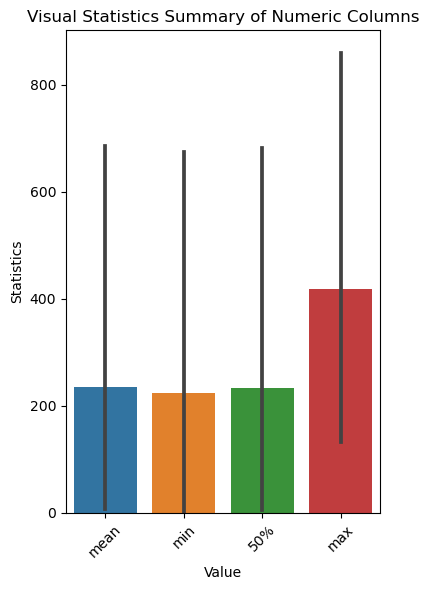

In [26]:
# Transpose the DataFrame to have statistics as rows and columns as numeric columns
summary_stats = df[numeric_datatype].describe().T

# Plotting
plt.figure(figsize=(4, 6))
sns.barplot(data=summary_stats[['mean', 'min', '50%', 'max']])
plt.title('Visual Statistics Summary of Numeric Columns')
plt.xlabel('Value')
plt.ylabel('Statistics')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [27]:
# Compute the correlation matrix
corr_matrix = df[numeric_datatype].corr()

# Create heatmap
heatmap = go.Heatmap(
    z=corr_matrix.values,
    x=corr_matrix.columns,
    y=corr_matrix.columns,
    colorscale='cividis',
    colorbar=dict(title='Correlation'),
)

# Create annotations
annotations = []
for i, row in enumerate(corr_matrix.values):
    for j, value in enumerate(row):
        annotations.append(
            dict(
                x=corr_matrix.columns[j],
                y=corr_matrix.columns[i],
                text=str(round(value, 2)),
                showarrow=False,
                font=dict(color='white')
            )
        )

# Create figure
fig = go.Figure(data=heatmap)

# Add annotations to the figure layout
fig.update_layout(annotations=annotations)

# Add title
fig.update_layout(title='Correlation Heatmap of Numeric Columns')

# Show plot
fig.show()

In [28]:
# lower number of distinct value columns
low_col = ['YR', 'HOUR_INCI_BIN', 'TYCOD', 'ALARM_LEV', 'RANGE', 'DAY_OF_WEEK', 'ACTION_CODE', 'MNTH_NAME', 'MNTH'
          , 'UNIT_STATUS', 'SUB_TYCOD']

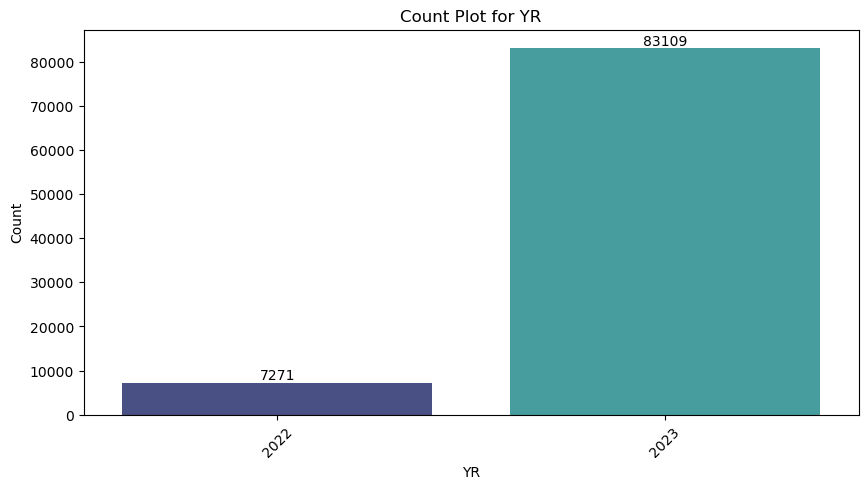

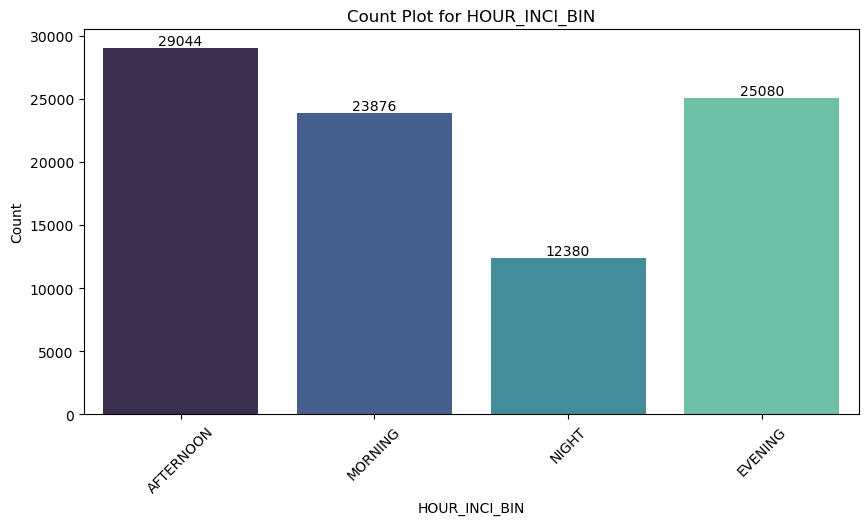

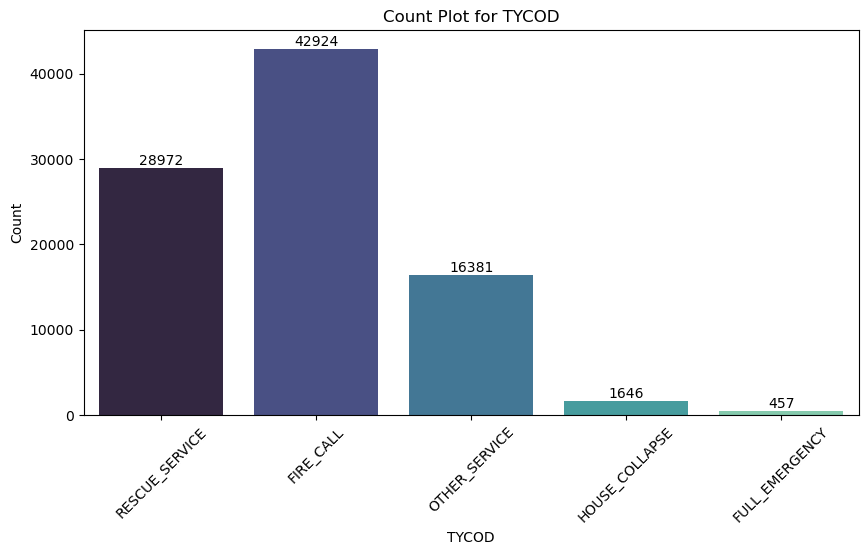

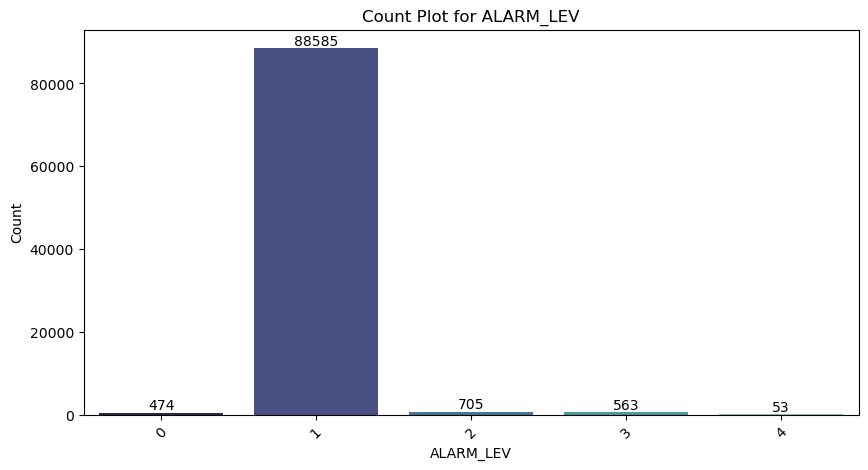

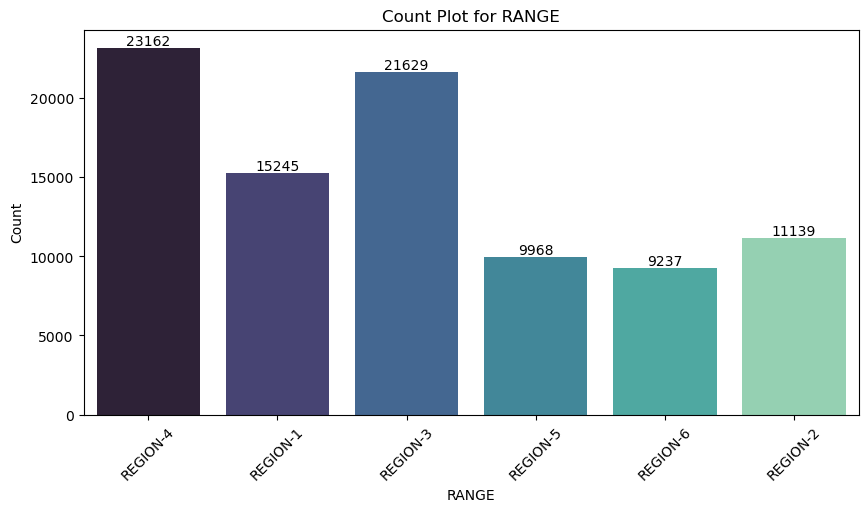

...

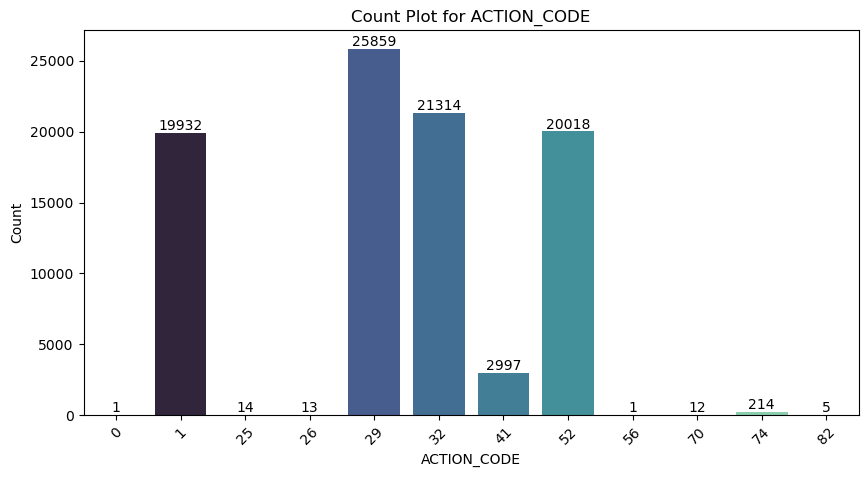

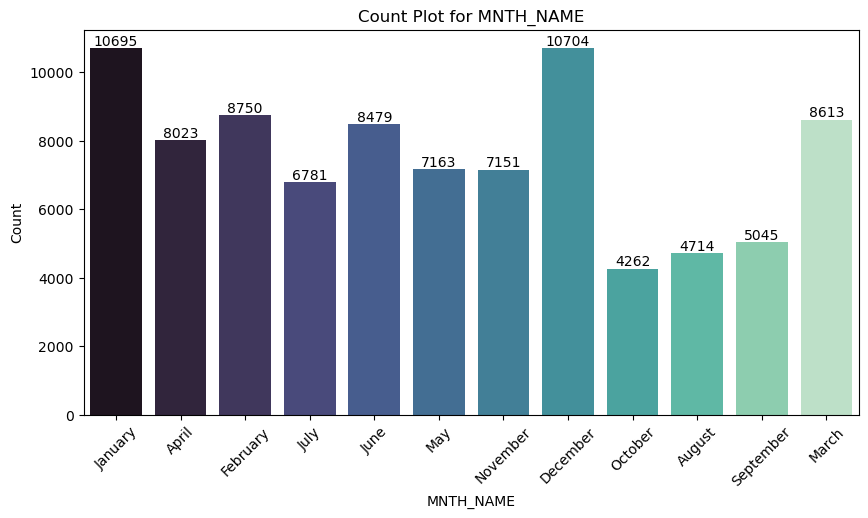

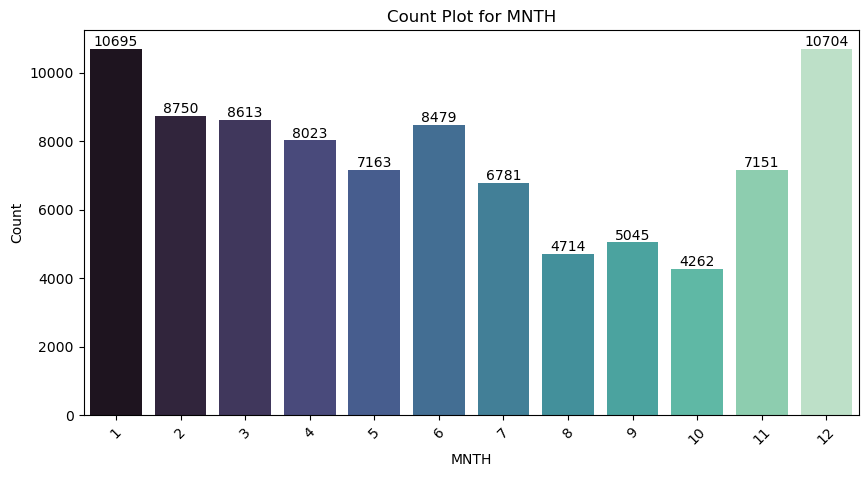

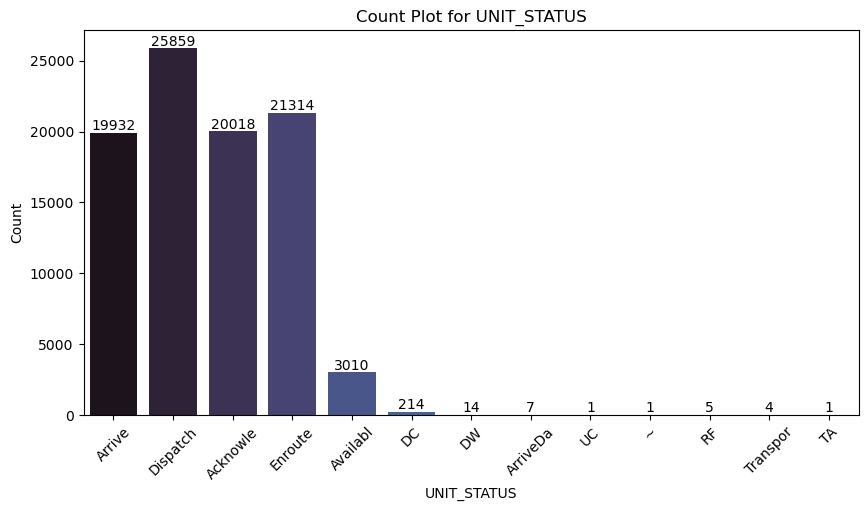

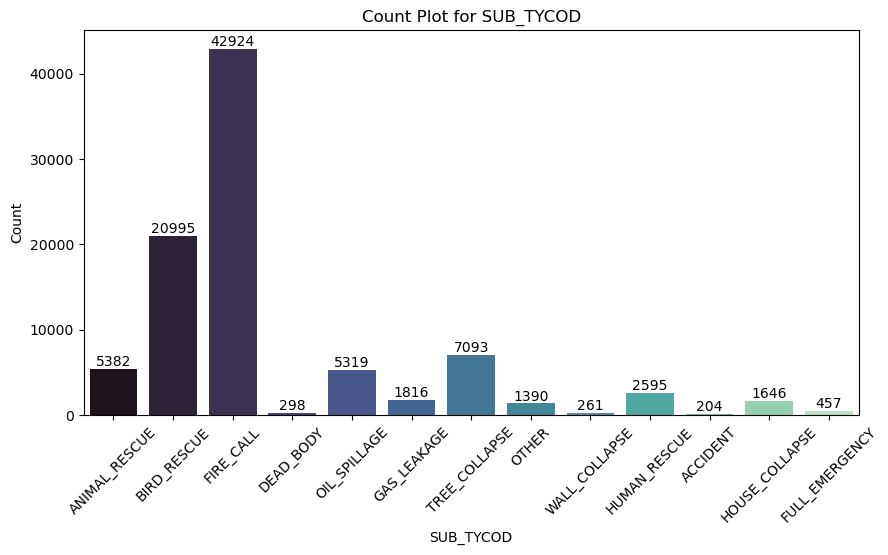

In [29]:
# Loop through each column in the list
for col in low_col:
    # Create count plot
    plt.figure(figsize=(10, 5))
    ax = sns.countplot(data=df, x=col, palette='mako')
    
    # Add annotations to the bars
    for p in ax.patches:
        ax.annotate(format(p.get_height(), '.0f'), 
                    (p.get_x() + p.get_width() / 2., p.get_height()), 
                    ha='center', va='center', 
                    xytext=(0, 5), 
                    textcoords='offset points')
    
    # Add title and labels
    plt.title(f'Count Plot for {col}')
    plt.xlabel(col)
    plt.ylabel('Count')
    
    # Rotate x-axis labels for better readability
    plt.xticks(rotation=45)
    
    # Show plot
    plt.show()

In [30]:
# higher number of distinct value columns
high_col = ['STATION', 'VEHICLE_TYPE', 'R_NO', 'ACKNOWLEDGE_TIME_IN_MINS', 'LEAVE_TIME_IN_MINS', 'TRAVEL_TIME_IN_MINS'
            , 'RESP_TIME_IN_MINS']

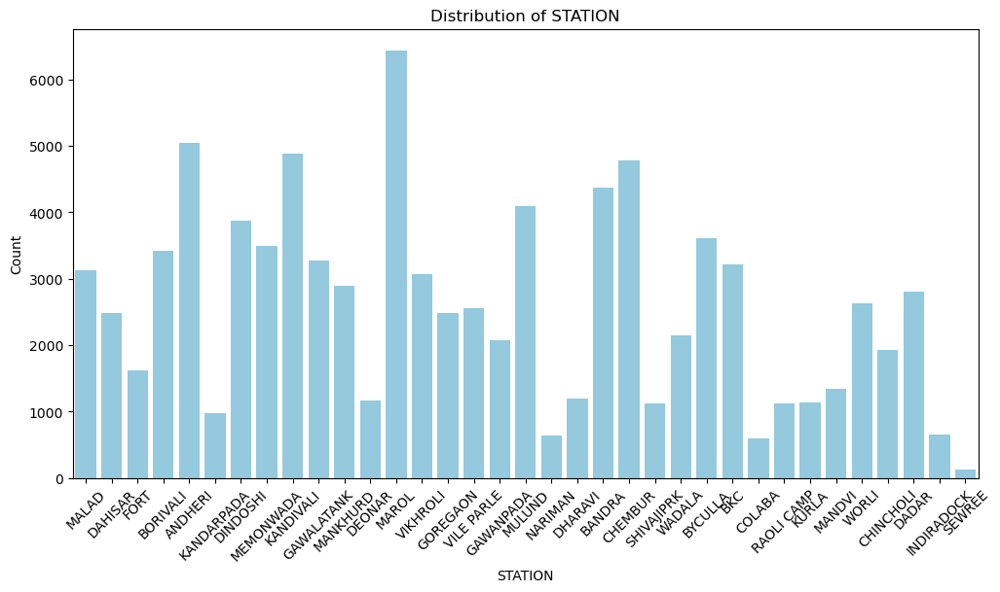

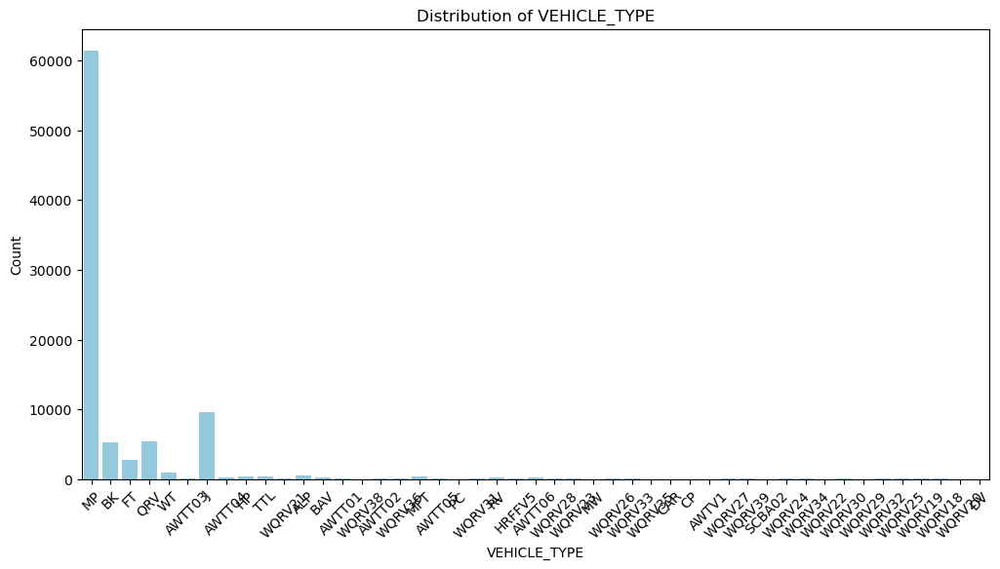

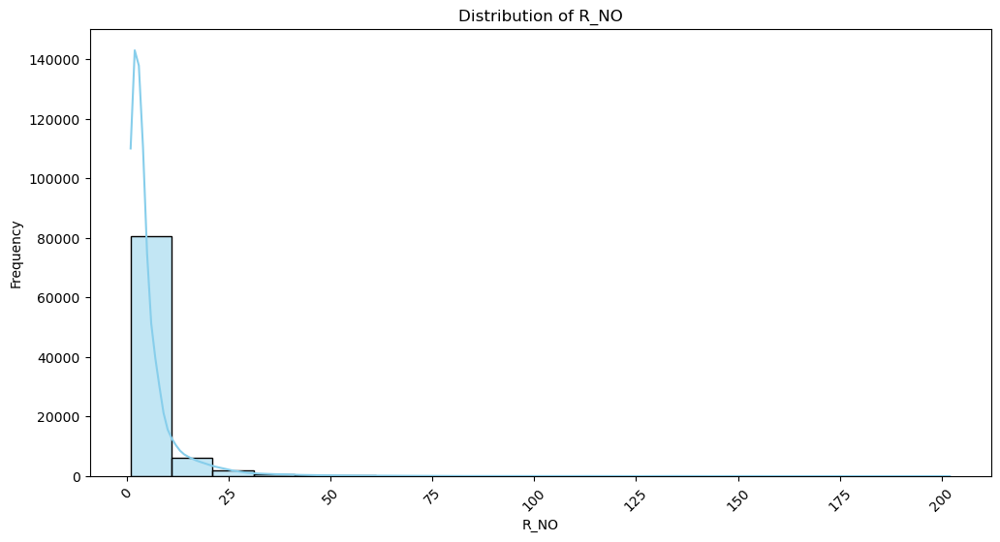

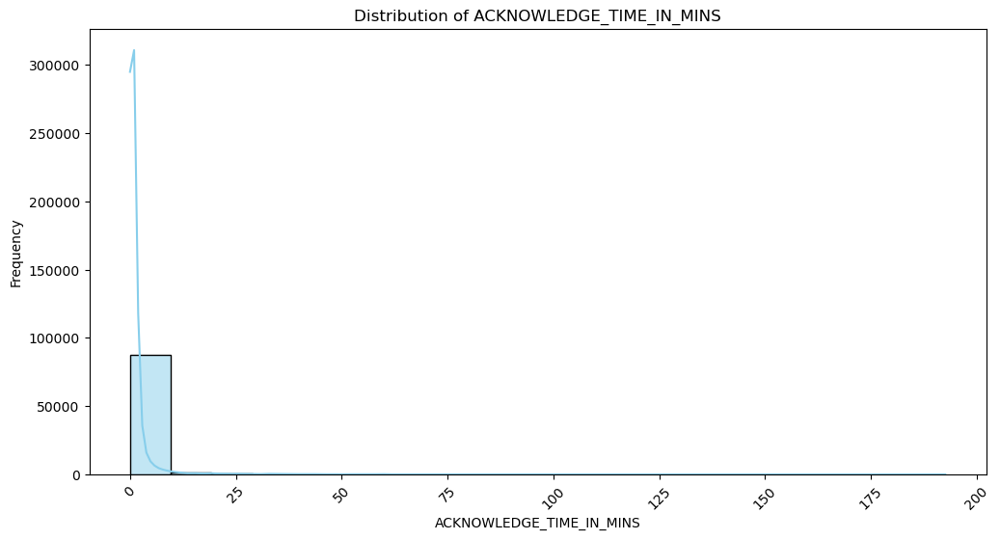

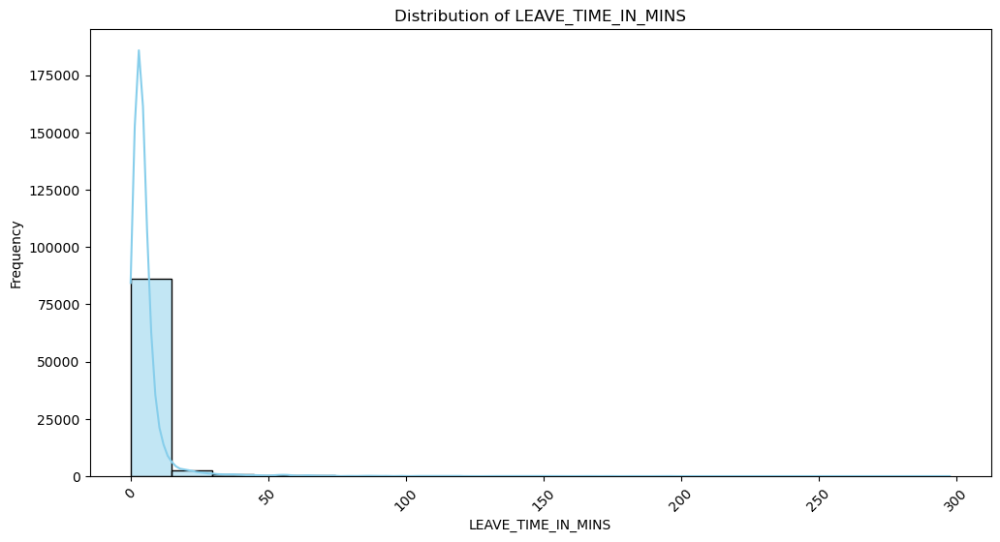

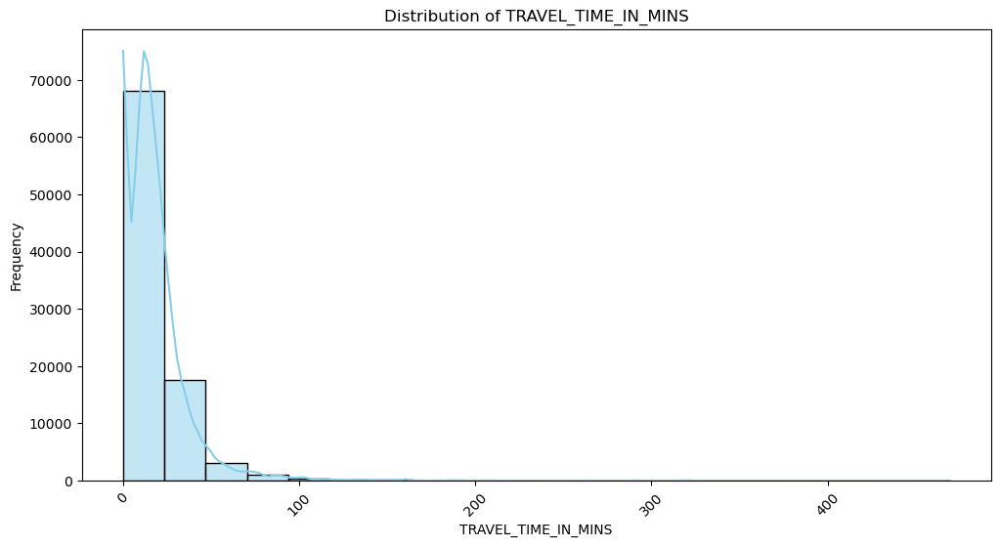

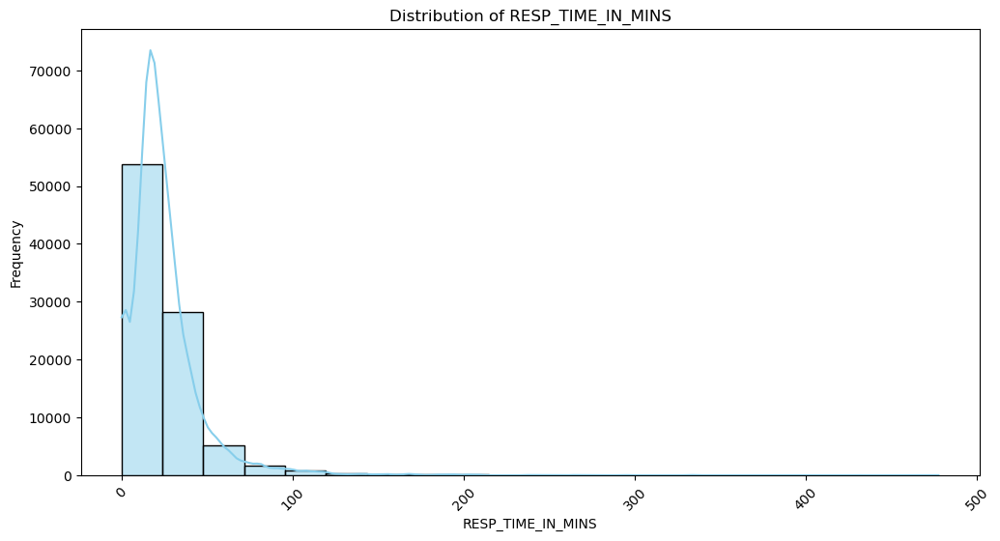

In [31]:
# Iterate through each column in high_col
for col in high_col:
    # Determine the data type of the column
    data_type = df[col].dtype
    
    # Create a new figure for each plot
    plt.figure(figsize=(12, 6))
    
    # If the column is numeric
    if data_type in ['int64', 'float64']:
        # Plot histogram for numeric columns
        sns.histplot(df[col].dropna(), kde=True, color='skyblue', bins=20)
        plt.title(f'Distribution of {col}')
        plt.xlabel(col)
        plt.ylabel('Frequency')
    else:
        # Plot count plot for categorical columns
        sns.countplot(data=df, x=col, color='skyblue')
        plt.title(f'Distribution of {col}')
        plt.xlabel(col)
        plt.ylabel('Count')
    
    # Rotate x-axis labels for better readability
    plt.xticks(rotation=45)
    
    # Show plot
    plt.show()

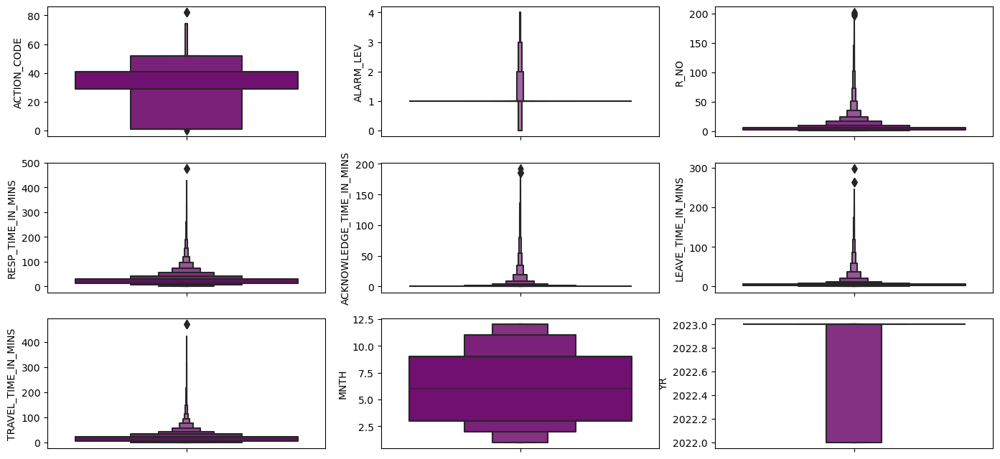

In [32]:
fig, ax = plt.subplots(ncols=3, nrows=3, figsize=(17,8))
index = 0
ax = ax.flatten()
for col, value in df[numeric_datatype].items():
    sns.boxenplot(y=col, data=df, ax=ax[index], color="purple")
    index += 1
plt.show()

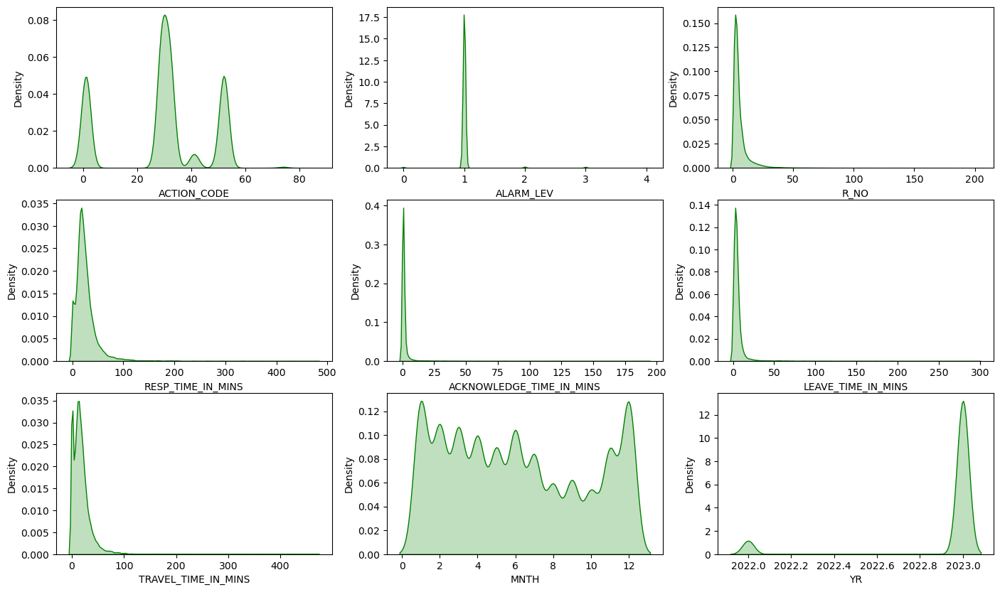

In [33]:
fig, ax = plt.subplots(ncols=3, nrows=3, figsize=(17,10))
index = 0
ax = ax.flatten()
for col, value in df[numeric_datatype].items():
    sns.distplot(value, ax=ax[index], hist=False, color="g", kde_kws={"shade": True})
    index += 1
plt.show()

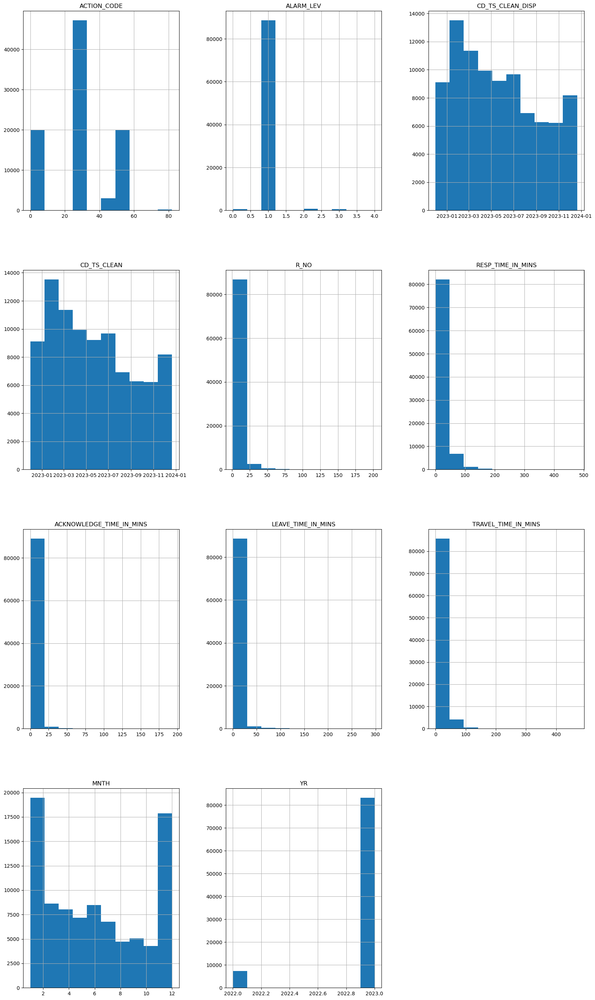

In [34]:
df.hist(figsize=(20,35))
plt.show()

In [35]:
numeric_df = df.select_dtypes(include=['int64', 'float64'])
numeric_df

,ACTION_CODE,ALARM_LEV,R_NO,RESP_TIME_IN_MINS,ACKNOWLEDGE_TIME_IN_MINS,LEAVE_TIME_IN_MINS,TRAVEL_TIME_IN_MINS,MNTH,YR
0,1,1,4,135.93,0.33,135.53,0.07,1,2023
1,29,1,1,8.10,0.20,1.95,5.95,1,2023
2,52,1,2,8.10,0.20,1.95,5.95,1,2023
3,32,1,3,8.10,0.20,1.95,5.95,1,2023
4,1,1,4,8.10,0.20,1.95,5.95,1,2023
...,...,...,...,...,...,...,...,...,...
90375,32,1,3,17.05,0.57,3.73,12.75,9,2023
90376,1,1,4,17.05,0.57,3.73,12.75,9,2023
90377,29,1,1,21.07,2.47,3.57,15.03,9,2023
90378,52,1,2,21.07,2.47,3.57,15.03,9,2023


In [36]:
object_df = df.select_dtypes(include=['object'])
object_df

,UNIT_STATUS,STATION,TYCOD,SUB_TYCOD,RANGE,VEHICLE_TYPE,HOUR_INCI_BIN,MNTH_NAME,DAY_OF_WEEK,CLEAN_DATE,City
0,Arrive,MALAD,RESCUE_SERVICE,ANIMAL_RESCUE,REGION-4,MP,AFTERNOON,January,Friday,2023-01-20,Borivli
1,Dispatch,DAHISAR,RESCUE_SERVICE,BIRD_RESCUE,REGION-4,MP,AFTERNOON,January,Friday,2023-01-20,Borivli
2,Acknowle,DAHISAR,RESCUE_SERVICE,BIRD_RESCUE,REGION-4,MP,AFTERNOON,January,Friday,2023-01-20,Borivli
3,Enroute,DAHISAR,RESCUE_SERVICE,BIRD_RESCUE,REGION-4,MP,AFTERNOON,January,Friday,2023-01-20,Borivli
4,Arrive,DAHISAR,RESCUE_SERVICE,BIRD_RESCUE,REGION-4,MP,AFTERNOON,January,Friday,2023-01-20,Borivli
...,...,...,...,...,...,...,...,...,...,...,...
90375,Enroute,MEMONWADA,HOUSE_COLLAPSE,HOUSE_COLLAPSE,REGION-1,MP,AFTERNOON,September,Tuesday,2023-09-19,Mumbai
90376,Arrive,MEMONWADA,HOUSE_COLLAPSE,HOUSE_COLLAPSE,REGION-1,MP,AFTERNOON,September,Tuesday,2023-09-19,Mumbai
90377,Dispatch,CHEMBUR,OTHER_SERVICE,WALL_COLLAPSE,REGION-5,MP,EVENING,September,Tuesday,2023-09-19,Mumbai
90378,Acknowle,CHEMBUR,OTHER_SERVICE,WALL_COLLAPSE,REGION-5,MP,EVENING,September,Tuesday,2023-09-19,Mumbai


In [37]:
# Calculate correlation matrix
correlation_matrix = numeric_df.corr()

# Transpose correlation matrix
correlation_matrix_transposed = correlation_matrix.transpose()

# Mask lower triangle values
mask = np.tril(np.ones_like(correlation_matrix_transposed, dtype=bool))

# Replace lower triangle values with None
correlation_matrix_transposed = correlation_matrix_transposed.mask(mask)

# Create Plotly heatmap
fig = go.Figure(data=go.Heatmap(
                   z=correlation_matrix_transposed.values,
                   x=correlation_matrix_transposed.columns,
                   y=correlation_matrix_transposed.index,
                   colorscale='ylgn',
                   zmin=-1,
                   zmax=1,
                   text=correlation_matrix_transposed.values.round(3),
                   hoverinfo='text'
                 ))

# Customize layout
fig.update_layout(
    title='Correlation Heatmap',
    xaxis=dict(title='Features', tickfont=dict(size=14), showgrid=False),  # Hide x-axis grid lines
    yaxis=dict(title='Features', tickfont=dict(size=14), showgrid=False),  # Hide y-axis grid lines
    plot_bgcolor='rgba(0,0,0,0)'  # Remove background color
)

# Show plot
fig.show()

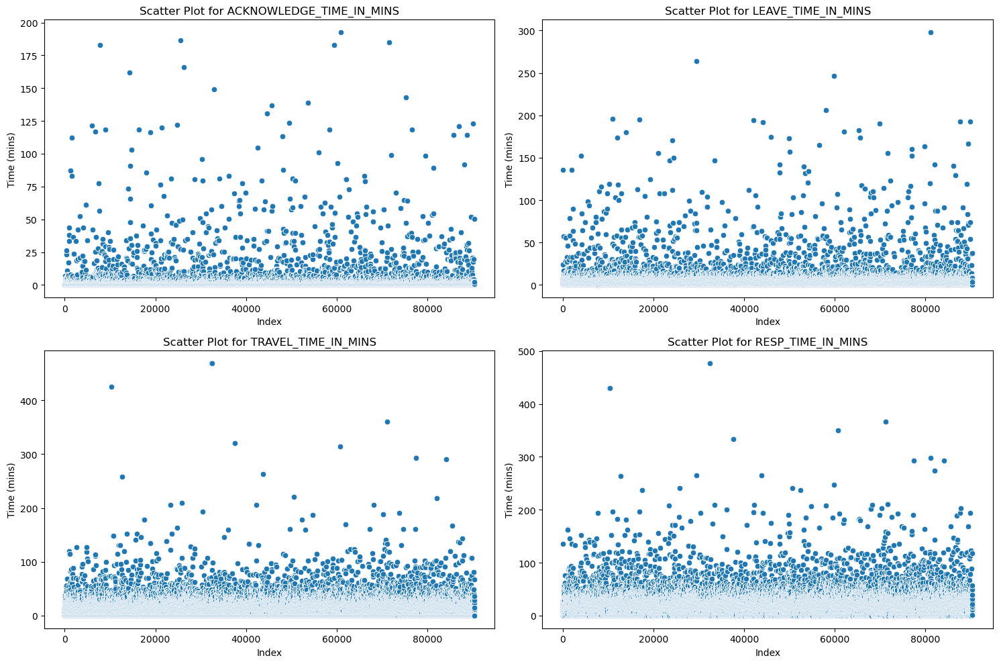

In [38]:
# Create scatter plots using Seaborn
plt.figure(figsize=(15, 10))

# Plot for ACKNOWLEDGE_TIME_IN_MINS
plt.subplot(2, 2, 1)
sns.scatterplot(data=df, x=df.index, y='ACKNOWLEDGE_TIME_IN_MINS')
plt.title('Scatter Plot for ACKNOWLEDGE_TIME_IN_MINS')
plt.xlabel('Index')
plt.ylabel('Time (mins)')

# Plot for LEAVE_TIME_IN_MINS
plt.subplot(2, 2, 2)
sns.scatterplot(data=df, x=df.index, y='LEAVE_TIME_IN_MINS')
plt.title('Scatter Plot for LEAVE_TIME_IN_MINS')
plt.xlabel('Index')
plt.ylabel('Time (mins)')

# Plot for TRAVEL_TIME_IN_MINS
plt.subplot(2, 2, 3)
sns.scatterplot(data=df, x=df.index, y='TRAVEL_TIME_IN_MINS')
plt.title('Scatter Plot for TRAVEL_TIME_IN_MINS')
plt.xlabel('Index')
plt.ylabel('Time (mins)')

# Plot for RESP_TIME_IN_MINS
plt.subplot(2, 2, 4)
sns.scatterplot(data=df, x=df.index, y='RESP_TIME_IN_MINS')
plt.title('Scatter Plot for RESP_TIME_IN_MINS')
plt.xlabel('Index')
plt.ylabel('Time (mins)')

plt.tight_layout()
plt.show()

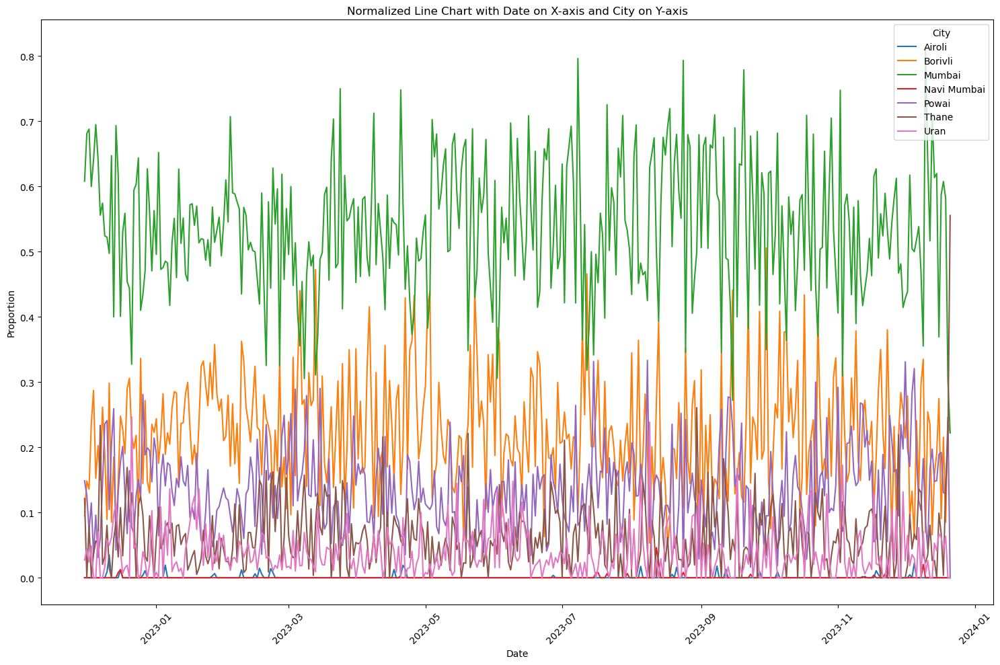

In [39]:
# Convert "CLEAN_DATE" column to datetime if not already
df['CLEAN_DATE'] = pd.to_datetime(df['CLEAN_DATE'])

# Group data by "CLEAN_DATE" and aggregate "City" column
grouped_data = df.groupby(['CLEAN_DATE', 'City']).size().unstack(fill_value=0)

# Normalize the data
normalized_data = grouped_data.div(grouped_data.sum(axis=1), axis=0)

# Plotting
plt.figure(figsize=(15, 10))

for column in normalized_data.columns:
    plt.plot(normalized_data.index, normalized_data[column], label=column)

plt.title('Normalized Line Chart with Date on X-axis and City on Y-axis')
plt.xlabel('Date')
plt.ylabel('Proportion')
plt.xticks(rotation=45)
plt.legend(title='City')
plt.tight_layout()
plt.show()

In [40]:
df

,UNIT_STATUS,ACTION_CODE,STATION,TYCOD,SUB_TYCOD,ALARM_LEV,CD_TS_CLEAN_DISP,CD_TS_CLEAN,RANGE,R_NO,VEHICLE_TYPE,RESP_TIME_IN_MINS,ACKNOWLEDGE_TIME_IN_MINS,LEAVE_TIME_IN_MINS,TRAVEL_TIME_IN_MINS,HOUR_INCI_BIN,MNTH,YR,MNTH_NAME,DAY_OF_WEEK,CLEAN_DATE,City
0,Arrive,1,MALAD,RESCUE_SERVICE,ANIMAL_RESCUE,1,2023-01-20 13:24:34,2023-01-20 15:40:30,REGION-4,4,MP,135.93,0.33,135.53,0.07,AFTERNOON,1,2023,January,Friday,2023-01-20,Borivli
1,Dispatch,29,DAHISAR,RESCUE_SERVICE,BIRD_RESCUE,1,2023-01-20 13:55:53,2023-01-20 13:56:05,REGION-4,1,MP,8.10,0.20,1.95,5.95,AFTERNOON,1,2023,January,Friday,2023-01-20,Borivli
2,Acknowle,52,DAHISAR,RESCUE_SERVICE,BIRD_RESCUE,1,2023-01-20 13:55:53,2023-01-20 13:56:11,REGION-4,2,MP,8.10,0.20,1.95,5.95,AFTERNOON,1,2023,January,Friday,2023-01-20,Borivli
3,Enroute,32,DAHISAR,RESCUE_SERVICE,BIRD_RESCUE,1,2023-01-20 13:55:53,2023-01-20 13:58:02,REGION-4,3,MP,8.10,0.20,1.95,5.95,AFTERNOON,1,2023,January,Friday,2023-01-20,Borivli
4,Arrive,1,DAHISAR,RESCUE_SERVICE,BIRD_RESCUE,1,2023-01-20 13:55:53,2023-01-20 14:03:59,REGION-4,4,MP,8.10,0.20,1.95,5.95,AFTERNOON,1,2023,January,Friday,2023-01-20,Borivli
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
90375,Enroute,32,MEMONWADA,HOUSE_COLLAPSE,HOUSE_COLLAPSE,1,2023-09-19 12:44:34,2023-09-19 12:48:52,REGION-1,3,MP,17.05,0.57,3.73,12.75,AFTERNOON,9,2023,September,Tuesday,2023-09-19,Mumbai
90376,Arrive,1,MEMONWADA,HOUSE_COLLAPSE,HOUSE_COLLAPSE,1,2023-09-19 12:44:34,2023-09-19 13:01:37,REGION-1,4,MP,17.05,0.57,3.73,12.75,AFTERNOON,9,2023,September,Tuesday,2023-09-19,Mumbai
90377,Dispatch,29,CHEMBUR,OTHER_SERVICE,WALL_COLLAPSE,1,2023-09-19 22:52:08,2023-09-19 22:54:36,REGION-5,1,MP,21.07,2.47,3.57,15.03,EVENING,9,2023,September,Tuesday,2023-09-19,Mumbai
90378,Acknowle,52,CHEMBUR,OTHER_SERVICE,WALL_COLLAPSE,1,2023-09-19 22:52:08,2023-09-19 22:54:50,REGION-5,2,MP,21.07,2.47,3.57,15.03,EVENING,9,2023,September,Tuesday,2023-09-19,Mumbai


In [41]:
df.columns

Index(['UNIT_STATUS', 'ACTION_CODE', 'STATION', 'TYCOD', 'SUB_TYCOD',
       'ALARM_LEV', 'CD_TS_CLEAN_DISP', 'CD_TS_CLEAN', 'RANGE', 'R_NO',
       'VEHICLE_TYPE', 'RESP_TIME_IN_MINS', 'ACKNOWLEDGE_TIME_IN_MINS',
       'LEAVE_TIME_IN_MINS', 'TRAVEL_TIME_IN_MINS', 'HOUR_INCI_BIN', 'MNTH',
       'YR', 'MNTH_NAME', 'DAY_OF_WEEK', 'CLEAN_DATE', 'City'],
      dtype='object')

### Ending Logging in filename='notebook_execution_log.log'

In [42]:
try:
    # Log notebook execution end
    logging.info("Notebook execution completed.")
except Exception as e:
    # Log any errors that occur during notebook execution
    logging.error(f"An error occurred during notebook execution: {str(e)}")
finally:
    # Ensure the log file is closed
    logging.shutdown()